# Verify FLUX-backbone LoRA effect across training

Compare reconstructions on N held-out HVM test stimuli across the frozen FLUX backbone and all saved LoRA checkpoints, conditioning on **GT SigLIP**. Checkpoints are auto-discovered from `FLUX_LORA_DIR` and sorted by step number. Outputs a side-by-side grid + SSIM / LPIPS / PixCorr / SigLIP-cosine metrics per checkpoint.

In [1]:
import sys, re
from pathlib import Path
import torch
import torchvision.transforms as T
from PIL import Image

sys.path.append('..')
from config_const import (
    SEED, HVM_STIM_DIR, HVM_N_VAR, HVM_CATEGORIES,
    HVM_SIGLIP_EMBEDDINGS_PATH, FLUX_LORA_DIR,
)
from data_utils.hvm_loader import _category_stratified_split
from generation.flux_instantx import load_pipeline, generate_img2img
from generation.aperture import load_hvm_packed_aperture_mask
from encoders.siglip_embed import load_siglip, embed_images_stripped
from eval.metrics import ssim, cosine_similarity
from get_device import get_device

DEVICE     = get_device()
N_TEST     = 5
IMAGE_SIZE = 512
STRENGTH   = 0.6
STEPS      = 20

def _step(p):
    m = re.search(r'_step(\d+)', p.stem)
    return int(m.group(1)) if m else -1

VARIANTS = [('frozen', None)]
ckpts = sorted(
    [p for p in FLUX_LORA_DIR.glob('hvm_r16_step*.safetensors')],
    key=_step,
)
for p in ckpts:
    VARIANTS.append((f'lora_step{_step(p)}', p))
for label, p in VARIANTS: print(f'  {label:<16s}{p}')


  frozen          None
  lora_step500    /home/yy3658/NeurObjectGen/checkpoints/flux_lora/hvm_r16_step500.safetensors
  lora_step1000   /home/yy3658/NeurObjectGen/checkpoints/flux_lora/hvm_r16_step1000.safetensors
  lora_step1500   /home/yy3658/NeurObjectGen/checkpoints/flux_lora/hvm_r16_step1500.safetensors
  lora_step2000   /home/yy3658/NeurObjectGen/checkpoints/flux_lora/hvm_r16_step2000.safetensors
  lora_step2500   /home/yy3658/NeurObjectGen/checkpoints/flux_lora/hvm_r16_step2500.safetensors
  lora_step3000   /home/yy3658/NeurObjectGen/checkpoints/flux_lora/hvm_r16_step3000.safetensors
  lora_step3500   /home/yy3658/NeurObjectGen/checkpoints/flux_lora/hvm_r16_step3500.safetensors
  lora_step4000   /home/yy3658/NeurObjectGen/checkpoints/flux_lora/hvm_r16_step4000.safetensors


In [2]:
_, _, test_idx = _category_stratified_split(SEED)
test_idx = test_idx[:N_TEST]

def load_stim(i):
    cat = HVM_CATEGORIES[i // HVM_N_VAR]
    var = i % HVM_N_VAR
    return Image.open(HVM_STIM_DIR / cat / f'{var:02d}.png').convert('RGB').resize((IMAGE_SIZE, IMAGE_SIZE), Image.LANCZOS)

originals = [load_stim(int(i)) for i in test_idx]
siglip_gt = torch.load(HVM_SIGLIP_EMBEDDINGS_PATH, weights_only=True)[test_idx]
print(f'{len(originals)} stimuli, siglip_gt {tuple(siglip_gt.shape)}')

5 stimuli, siglip_gt (5, 1152)


In [3]:
# generate with each variant — load the pipeline fresh each time so LoRA is
# wired in via load_pipeline(flux_lora_path=...). Do NOT fuse so we can swap.
aperture = load_hvm_packed_aperture_mask(image_size=IMAGE_SIZE, device='cpu', dtype=torch.bfloat16)

def gen(pipe, image_proj, orig, sig, seed):
    return generate_img2img(
        pipe, image_proj, orig, sig,
        ip_adapter_scale=1.0, prompt='', strength=STRENGTH,
        height=IMAGE_SIZE, width=IMAGE_SIZE,
        num_inference_steps=STEPS, guidance_scale=3.5,
        aperture_mask=aperture, seed=seed, show_progress=False,
    )

all_recons = {}
for label, lora_path in VARIANTS:
    print(f'generating {label}...')
    pipe, image_proj = load_pipeline(device=DEVICE, default_scale=1.0, flux_lora_path=lora_path)
    all_recons[label] = [gen(pipe, image_proj, orig, sig, i) for i, (orig, sig) in enumerate(zip(originals, siglip_gt))]
    del pipe, image_proj
    torch.cuda.empty_cache()
print('done')

generating frozen...


Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

Loading weights:   0%|          | 0/196 [00:00<?, ?it/s]

Loading checkpoint shards:   0%|          | 0/3 [00:00<?, ?it/s]

Loading weights:   0%|          | 0/219 [00:00<?, ?it/s]

generating lora_step500...


Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

Loading weights:   0%|          | 0/196 [00:00<?, ?it/s]

Loading checkpoint shards:   0%|          | 0/3 [00:00<?, ?it/s]

Loading weights:   0%|          | 0/219 [00:00<?, ?it/s]

No LoRA keys associated to CLIPTextModel found with the prefix='text_encoder'. This is safe to ignore if LoRA state dict didn't originally have any CLIPTextModel related params. You can also try specifying `prefix=None` to resolve the warning. Otherwise, open an issue if you think it's unexpected: https://github.com/huggingface/diffusers/issues/new


generating lora_step1000...


Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

Loading weights:   0%|          | 0/196 [00:00<?, ?it/s]

Loading checkpoint shards:   0%|          | 0/3 [00:00<?, ?it/s]

Loading weights:   0%|          | 0/219 [00:00<?, ?it/s]

No LoRA keys associated to CLIPTextModel found with the prefix='text_encoder'. This is safe to ignore if LoRA state dict didn't originally have any CLIPTextModel related params. You can also try specifying `prefix=None` to resolve the warning. Otherwise, open an issue if you think it's unexpected: https://github.com/huggingface/diffusers/issues/new


generating lora_step1500...


Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

Loading weights:   0%|          | 0/196 [00:00<?, ?it/s]

Loading checkpoint shards:   0%|          | 0/3 [00:00<?, ?it/s]

Loading weights:   0%|          | 0/219 [00:00<?, ?it/s]

No LoRA keys associated to CLIPTextModel found with the prefix='text_encoder'. This is safe to ignore if LoRA state dict didn't originally have any CLIPTextModel related params. You can also try specifying `prefix=None` to resolve the warning. Otherwise, open an issue if you think it's unexpected: https://github.com/huggingface/diffusers/issues/new


generating lora_step2000...


Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

Loading weights:   0%|          | 0/196 [00:00<?, ?it/s]

Loading checkpoint shards:   0%|          | 0/3 [00:00<?, ?it/s]

Loading weights:   0%|          | 0/219 [00:00<?, ?it/s]

No LoRA keys associated to CLIPTextModel found with the prefix='text_encoder'. This is safe to ignore if LoRA state dict didn't originally have any CLIPTextModel related params. You can also try specifying `prefix=None` to resolve the warning. Otherwise, open an issue if you think it's unexpected: https://github.com/huggingface/diffusers/issues/new


generating lora_step2500...


Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

Loading weights:   0%|          | 0/196 [00:00<?, ?it/s]

Loading checkpoint shards:   0%|          | 0/3 [00:00<?, ?it/s]

Loading weights:   0%|          | 0/219 [00:00<?, ?it/s]

No LoRA keys associated to CLIPTextModel found with the prefix='text_encoder'. This is safe to ignore if LoRA state dict didn't originally have any CLIPTextModel related params. You can also try specifying `prefix=None` to resolve the warning. Otherwise, open an issue if you think it's unexpected: https://github.com/huggingface/diffusers/issues/new


generating lora_step3000...


Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

Loading weights:   0%|          | 0/196 [00:00<?, ?it/s]

Loading checkpoint shards:   0%|          | 0/3 [00:00<?, ?it/s]

Loading weights:   0%|          | 0/219 [00:00<?, ?it/s]

No LoRA keys associated to CLIPTextModel found with the prefix='text_encoder'. This is safe to ignore if LoRA state dict didn't originally have any CLIPTextModel related params. You can also try specifying `prefix=None` to resolve the warning. Otherwise, open an issue if you think it's unexpected: https://github.com/huggingface/diffusers/issues/new


generating lora_step3500...


Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

Loading weights:   0%|          | 0/196 [00:00<?, ?it/s]

Loading checkpoint shards:   0%|          | 0/3 [00:00<?, ?it/s]

Loading weights:   0%|          | 0/219 [00:00<?, ?it/s]

No LoRA keys associated to CLIPTextModel found with the prefix='text_encoder'. This is safe to ignore if LoRA state dict didn't originally have any CLIPTextModel related params. You can also try specifying `prefix=None` to resolve the warning. Otherwise, open an issue if you think it's unexpected: https://github.com/huggingface/diffusers/issues/new


generating lora_step4000...


Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

Loading weights:   0%|          | 0/196 [00:00<?, ?it/s]

Loading checkpoint shards:   0%|          | 0/3 [00:00<?, ?it/s]

Loading weights:   0%|          | 0/219 [00:00<?, ?it/s]

No LoRA keys associated to CLIPTextModel found with the prefix='text_encoder'. This is safe to ignore if LoRA state dict didn't originally have any CLIPTextModel related params. You can also try specifying `prefix=None` to resolve the warning. Otherwise, open an issue if you think it's unexpected: https://github.com/huggingface/diffusers/issues/new


done


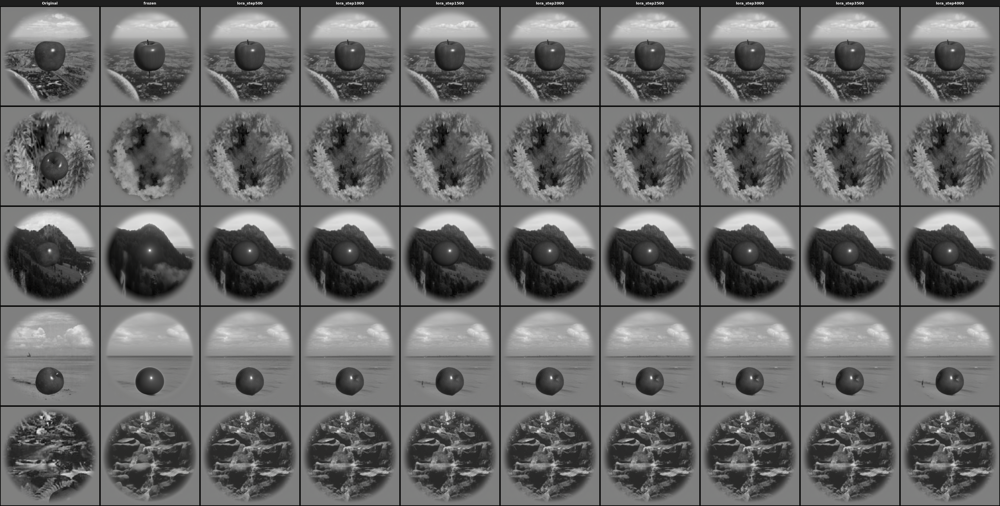

In [4]:
# grid: original | frozen | lora_step500 | lora_step1000 | ...
from PIL import ImageDraw, ImageFont
labels = ['Original'] + [v[0] for v in VARIANTS]
n_cols = len(labels)
try: font = ImageFont.truetype('/usr/share/fonts/truetype/dejavu/DejaVuSans-Bold.ttf', 18)
except: font = ImageFont.load_default()
W, H = IMAGE_SIZE, IMAGE_SIZE
LH = 32
grid = Image.new('RGB', (n_cols * W, N_TEST * H + LH), (30, 30, 30))
d = ImageDraw.Draw(grid)
for j, lbl in enumerate(labels):
    bbox = d.textbbox((0, 0), lbl, font=font)
    d.text((j * W + (W - (bbox[2] - bbox[0])) // 2, 6), lbl, font=font, fill=(255, 255, 255))
for r in range(N_TEST):
    cols = [originals[r]] + [all_recons[v[0]][r] for v in VARIANTS]
    for c, im in enumerate(cols):
        grid.paste(im, (c * W, LH + r * H))
grid

In [5]:
# metrics: SSIM, LPIPS, PixCorr (vs. original) + SigLIP-cosine (vs. GT embedding)
import numpy as np
import lpips
to_tensor = T.ToTensor()
siglip_proc, siglip_model = load_siglip(device=DEVICE)
lpips_fn = lpips.LPIPS(net='vgg').to(DEVICE)
orig_batch = torch.stack([to_tensor(o) for o in originals])          # (N, 3, H, W) in [0,1]
orig_np    = orig_batch.numpy().reshape(len(originals), -1)           # (N, H*W*3)

def metrics(recons):
    rec_batch = torch.stack([to_tensor(r) for r in recons])
    # SSIM
    ssim_score = ssim(rec_batch, orig_batch)
    # LPIPS (VGG): input in [-1, 1]
    with torch.no_grad():
        lp = lpips_fn(
            rec_batch.to(DEVICE) * 2 - 1,
            orig_batch.to(DEVICE) * 2 - 1,
        ).mean().item()
    # PixCorr: Pearson r between flattened pixels, averaged over stimuli
    rec_np = rec_batch.numpy().reshape(len(recons), -1)
    pixcorr = float(np.mean([
        np.corrcoef(rec_np[i], orig_np[i])[0, 1]
        for i in range(len(recons))
    ]))
    # SigLIP cosine
    rec_sigs = embed_images_stripped(siglip_proc, siglip_model, recons)
    cos_mean = cosine_similarity(rec_sigs, siglip_gt).mean().item()
    return ssim_score, lp, pixcorr, cos_mean

results = {label: metrics(recs) for label, recs in all_recons.items()}
fz_s, fz_l, fz_p, fz_c = results['frozen']
print(f'{"variant":<16s}{"SSIM↑":>8s}{"ΔSSIM":>8s}{"LPIPS↓":>8s}{"ΔLPIPS":>8s}{"PixCorr↑":>10s}{"ΔPixCorr":>10s}{"SigLIP-cos↑":>14s}{"Δcos":>8s}')
for label, (s, l, p, c) in results.items():
    print(f'{label:<16s}{s:>8.4f}{s-fz_s:>+8.4f}{l:>8.4f}{l-fz_l:>+8.4f}{p:>10.4f}{p-fz_p:>+10.4f}{c:>14.4f}{c-fz_c:>+8.4f}')


Loading weights:   0%|          | 0/888 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [vgg], v[0.1], spatial [off]


/home/yy3658/miniconda3/envs/objGen/lib/python3.12/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/yy3658/miniconda3/envs/objGen/lib/python3.12/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG16_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Loading model from: /home/yy3658/miniconda3/envs/objGen/lib/python3.12/site-packages/lpips/weights/v0.1/vgg.pth
variant            SSIM↑   ΔSSIM  LPIPS↓  ΔLPIPS  PixCorr↑  ΔPixCorr   SigLIP-cos↑    Δcos
frozen            0.7965 +0.0000  0.3213 +0.0000    0.9361   +0.0000        0.8192 +0.0000
lora_step500      0.7910 -0.0056  0.2980 -0.0233    0.9367   +0.0006        0.8751 +0.0559
lora_step1000     0.7901 -0.0065  0.2956 -0.0257    0.9363   +0.0002        0.8964 +0.0771
lora_step1500     0.7890 -0.0076  0.2978 -0.0236    0.9359   -0.0001        0.8951 +0.0759
lora_step2000     0.7852 -0.0114  0.2964 -0.0249    0.9351   -0.0010        0.9029 +0.0837
lora_step2500     0.7874 -0.0092  0.2966 -0.0247    0.9351   -0.0010        0.9021 +0.0829
lora_step3000     0.7871 -0.0094  0.2955 -0.0258    0.9349   -0.0012        0.9032 +0.0840
lora_step3500     0.7868 -0.0098  0.2952 -0.0261    0.9348   -0.0012        0.9035 +0.0842
lora_step4000     0.7871 -0.0095  0.2950 -0.0264    0.9349   -0.0012 